In [1]:
%matplotlib widget
import numpy as np
import json
import cv2
import matplotlib.pyplot as plt
import open3d as o3d

In [2]:
with open('camera_data_supporto_testa.json', 'r') as json_file:
    data = json.load(json_file)
print(data)

{'rgb_image': [[[251, 251, 251], [251, 251, 251], [252, 252, 252], [253, 253, 253], [253, 253, 253], [254, 254, 254], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [255, 255, 255], [254, 254, 254], [253, 253, 253], [253, 253, 253], [252, 252, 252], [251, 251, 251], [251, 250, 252], [247, 246, 250], [247, 245, 251], [245, 243, 249], [244, 242, 248], [242, 240, 246], [240, 238, 244], [239, 237, 243], [238, 236, 242], [237, 235, 241], [236, 234, 240], [235, 233, 239], [233, 231, 237], [233, 231, 237], [235, 233, 239], [236, 234, 240], [239, 235, 240], [243, 238, 240], [254, 248, 249], [250, 244, 245], [229, 223, 224], [217, 211, 212], [227, 221, 222], [246, 240, 241], [255, 251, 252], [255, 254, 255], [255, 254, 255]

nan


/var/folders/vj/b5k6wq4d6nv839dm1vg_yq3h0000gn/T/ipykernel_83628/3984708272.py:7: RuntimeWarning: invalid value encountered in cast
  depth_image_array_uint8 = depth_image_array.astype(np.uint8)


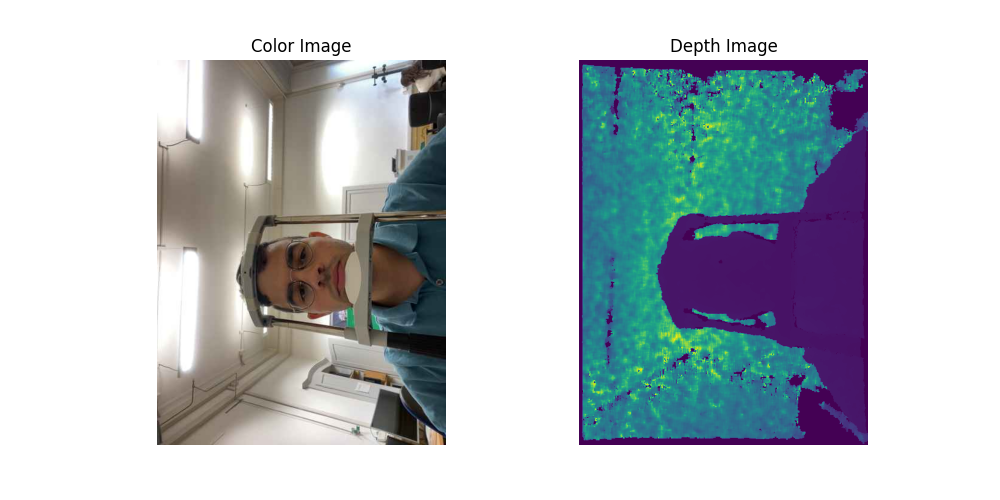

In [3]:
# Conversione della lista in un array NumPy
image_rgb_array = np.array(data['rgb_image']).astype(np.uint8)
depth_image_array = np.array(data['depth_image'])
array_no_nan = np.nan_to_num(depth_image_array, nan=0)
depth_image_array_norm = cv2.normalize(array_no_nan, None, 0, 255, cv2.NORM_MINMAX)
print(depth_image_array.min())
depth_image_array_uint8 = depth_image_array.astype(np.uint8)
image_rgb = cv2.cvtColor(image_rgb_array, cv2.COLOR_BGR2RGB)

# Create a figure with two subplots (1 row, 2 columns)
plt.figure(figsize=(10, 5))

# Display the first image in the first subplot
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Color Image")
plt.axis('off')  # Turn off axis labels

# Display the second image in the second subplot
plt.subplot(1, 2, 2)
plt.imshow(depth_image_array_norm)
plt.title("Depth Image")
plt.axis('off')  # Turn off axis labels

# Show the plot with both images
plt.show()

In [4]:
def integrating_rgb_depth(depth, intrinsic_mat):
    #depth = depth.tolist()
    cx = intrinsic_mat[0, 2]
    cy = intrinsic_mat[1, 2]
    fx = intrinsic_mat[0, 0]
    fy = intrinsic_mat[1, 1]
    # Ottieni le dimensioni della depth map
    h, w = depth.shape

    # Crea una griglia con le coordinate (u, v) dei pixel
    u, v = np.meshgrid(np.arange(w), np.arange(h))

    # Calcola le coordinate 3D
    X = (u - cx) * depth / fx
    Y = (v - cy) * depth / fy
    Z = depth

    # Stack delle coordinate in un array 3D
    points_3d = np.stack((X, Y, Z), axis=-1)
    return points_3d

In [5]:
def visualize_depth_cloud(points_3d):
    """
    Visualizza la nuvola di punti 3D utilizzando Matplotlib.

    :param points_3d: Array NumPy di forma (640, 480, 3) contenente le coordinate 3D.
    """
    # Estrai le coordinate 3D
    X = points_3d[:, :, 0]
    Y = points_3d[:, :, 1]
    Z = points_3d[:, :, 2]

    # Crea la figura 3D
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Seleziona un sottoinsieme dei punti per velocizzare il rendering (opzionale)
    stride = 10
    ax.scatter(X[::stride, ::stride], Y[::stride, ::stride], Z[::stride, ::stride], s=0.5, c=Z[::stride, ::stride], cmap='jet')
    
    axis_length = 1.0

    # Crea gli assi X, Y, Z
    ax.quiver(0, 0, 0, axis_length, 0, 0, color='r', label='Asse X', arrow_length_ratio=0.1)
    ax.quiver(0, 0, 0, 0, axis_length, 0, color='g', label='Asse Y', arrow_length_ratio=0.1)
    ax.quiver(0, 0, 0, 0, 0, axis_length, color='b', label='Asse Z', arrow_length_ratio=0.1)

    ax.axis('equal')
    # Imposta le etichette degli assi
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # Mostra la nuvola di punti
    ax.set_box_aspect([1,1,1])
    plt.show()

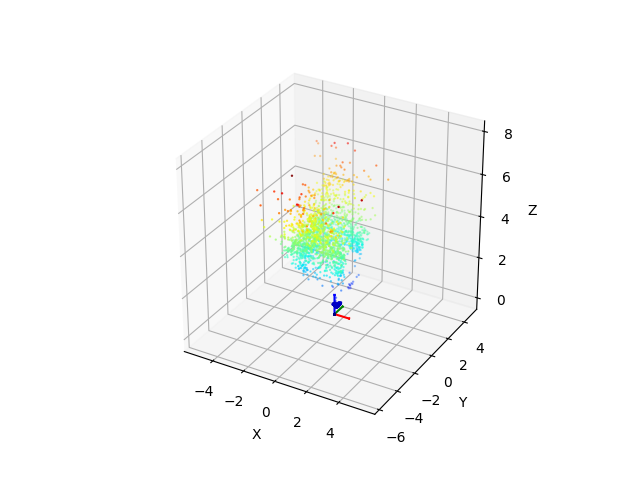

In [6]:
intrinsic_mat = np.array(data['camera_intrinsics'])
#print(intrinsic_mat)
a = array_no_nan.tolist()
coord3d = integrating_rgb_depth(array_no_nan, intrinsic_mat)

visualize_depth_cloud(coord3d)